In [5]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.plotly as py
import cufflinks as cf
cf.go_offline()

In [6]:
df = pd.read_csv('../data/players_20.csv')

In [7]:
df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [8]:
df.shape

(18278, 104)

## Studying variables

In [9]:
print(list(df.columns))

['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob', 'height_cm', 'weight_kg', 'nationality', 'club', 'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions', 'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'work_rate', 'body_type', 'real_face', 'release_clause_eur', 'player_tags', 'team_position', 'team_jersey_number', 'loaned_from', 'joined', 'contract_valid_until', 'nation_position', 'nation_jersey_number', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning', 'player_traits', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_

In [10]:
# Choosing data with numeric values 0-100 of players' characteristics
# Keeping data to identify the players
# Keeping team_position to separate players per position
# Dropping 5 out of 6 gk_something because they are better at goalkeeping_whatever
# Keeping gk_speed because no goalkeeping_speed availiable

df_stats = df[['sofifa_id', 'short_name', 'age', 'club', 'value_eur', 'team_position', 'attacking_crossing', 'attacking_finishing', 
           'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 
           'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration',
           'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power',
           'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression',
           'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 
           'mentality_composure', 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle', 
           'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 
           'goalkeeping_reflexes', 'overall']]

In [11]:
df_stats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 41 columns):
sofifa_id                     18278 non-null int64
short_name                    18278 non-null object
age                           18278 non-null int64
club                          18278 non-null object
value_eur                     18278 non-null int64
team_position                 18038 non-null object
attacking_crossing            18278 non-null int64
attacking_finishing           18278 non-null int64
attacking_heading_accuracy    18278 non-null int64
attacking_short_passing       18278 non-null int64
attacking_volleys             18278 non-null int64
skill_dribbling               18278 non-null int64
skill_curve                   18278 non-null int64
skill_fk_accuracy             18278 non-null int64
skill_long_passing            18278 non-null int64
skill_ball_control            18278 non-null int64
movement_acceleration         18278 non-null int64
movement_sprint_speed

In [12]:
df_stats.isna().sum()

sofifa_id                       0
short_name                      0
age                             0
club                            0
value_eur                       0
team_position                 240
attacking_crossing              0
attacking_finishing             0
attacking_heading_accuracy      0
attacking_short_passing         0
attacking_volleys               0
skill_dribbling                 0
skill_curve                     0
skill_fk_accuracy               0
skill_long_passing              0
skill_ball_control              0
movement_acceleration           0
movement_sprint_speed           0
movement_agility                0
movement_reactions              0
movement_balance                0
power_shot_power                0
power_jumping                   0
power_stamina                   0
power_strength                  0
power_long_shots                0
mentality_aggression            0
mentality_interceptions         0
mentality_positioning           0
mentality_visi

In [13]:
df_stats['team_position'].value_counts(dropna=False)

SUB    7820
RES    2958
GK      662
LCB     660
RCB     660
LB      560
RB      560
ST      458
LCM     411
RCM     411
RM      399
LM      398
CAM     311
RDM     244
LDM     242
NaN     240
LS      195
RS      195
CDM     181
LW      162
RW      161
CB      100
CM       76
RWB      58
LWB      58
RAM      23
LAM      23
RF       19
LF       19
CF       14
Name: team_position, dtype: int64

In [14]:
# We have a lot of values on position with no information: Nan, SUB, RES
# We will replace them with the first value at players_positions column

In [15]:
# player_positions have more than one value
# we are keeping the first position in players_positions in a new column (preferred_position)

def extract_first_pos(x):
    return x.split(',', 1)[0]

df['preferred_position'] = df['player_positions'].apply(extract_first_pos)

df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,preferred_position
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,RW
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,ST
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,LW
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GK
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,LW


In [16]:
df_stats['preferred_position'] = df['preferred_position']

In [17]:
df_stats.head()

,sofifa_id,short_name,age,club,value_eur,team_position,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,...,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,preferred_position
0,158023,L. Messi,32,FC Barcelona,95500000,RW,88,95,70,92,...,33,37,26,6,11,15,14,8,94,RW
1,20801,Cristiano Ronaldo,34,Juventus,58500000,LW,84,94,89,83,...,28,32,24,7,11,15,14,11,93,ST
2,190871,Neymar Jr,27,Paris Saint-Germain,105500000,CAM,87,87,62,87,...,27,26,29,9,9,15,15,11,92,LW
3,200389,J. Oblak,26,Atlético Madrid,77500000,GK,13,11,15,43,...,27,12,18,87,92,78,90,89,91,GK
4,183277,E. Hazard,28,Real Madrid,90000000,LW,81,84,61,89,...,34,27,22,11,12,6,8,8,91,LW


In [18]:
# Now, replace all players with SUB, RES or Nan in team_position with the value in preferred_position

df_stats['team_position'] = np.where(df_stats['team_position'] == 'SUB', 
                                     df_stats['preferred_position'], df_stats['team_position'])

df_stats['team_position'] = np.where(df_stats['team_position'] == 'RES', 
                                     df_stats['preferred_position'], df_stats['team_position'])

df_stats['team_position'] = np.where(df_stats['team_position'].isnull(), 
                                     df_stats['preferred_position'], df_stats['team_position'])

In [19]:
df_stats['team_position'].value_counts()

ST     2121
GK     2036
CB     1825
CM     1386
LB     1306
RB     1285
LM     1074
RM     1058
CAM    1006
CDM     991
LCB     660
RCB     660
LW      421
RCM     411
LCM     411
RW      395
RDM     244
LDM     242
LS      195
RS      195
LWB     101
RWB      89
CF       82
RAM      23
LAM      23
RF       19
LF       19
Name: team_position, dtype: int64

In [20]:
# There are too many different categories, so we better reduce them to 10 (GK, LD, CD, RD, LM, CM, RM, LF, CF, RF)
# These are for:
# Goalkeeper
# Left Defender, Center Defender, Right Defender
# Left Midfielder, Center Midfielder, Right Midfielder
# Left Forward, Center Forward, Right Forward

GK = ['GK']
LD = ['LB', 'LWB']
CD = ['CB', 'LCB', 'RCB']
RD = ['RB', 'RWB']
LM = ['LM', 'LCM', 'LDM']
CM = ['CM', 'CAM', 'CDM']
RM = ['RM', 'RCM', 'RDM']
LF = ['LW', 'LS', 'LAM', 'LF']
CF = ['ST', 'CF']
RF = ['RW', 'RS', 'RAM', 'RF']

def positions(x):
    if x in LD:
        return 'LD'
    elif x in CD:
        return 'CD'
    elif x in RD:
        return 'RD'
    elif x in LM:
        return 'LM'
    elif x in CM:
        return 'CM'
    elif x in RM:
        return 'RM'
    elif x in LF:
        return 'LF'
    elif x in CF:
        return 'CF'
    elif x in RF:
        return 'RF'
    elif x in GK:
        return 'GK'

In [21]:
df_stats['team_position'] = df_stats['team_position'].apply(positions)

df_stats['team_position'].value_counts()

CM    3383
CD    3145
CF    2203
GK    2036
LM    1727
RM    1713
LD    1407
RD    1374
LF     658
RF     632
Name: team_position, dtype: int64


## Visualization

### Barplot

In [48]:
# grouping players per position

groups_df = df_stats.groupby('team_position', as_index=False).agg('count')
groups_df

,team_position,sofifa_id,short_name,age,club,value_eur,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,...,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall,preferred_position,general_position
0,CD,3145,3145,3145,3145,3145,3145,3145,3145,3145,...,3145,3145,3145,3145,3145,3145,3145,3145,3145,3145
1,CF,2203,2203,2203,2203,2203,2203,2203,2203,2203,...,2203,2203,2203,2203,2203,2203,2203,2203,2203,2203
2,CM,3383,3383,3383,3383,3383,3383,3383,3383,3383,...,3383,3383,3383,3383,3383,3383,3383,3383,3383,3383
3,GK,2036,2036,2036,2036,2036,2036,2036,2036,2036,...,2036,2036,2036,2036,2036,2036,2036,2036,2036,2036
4,LD,1407,1407,1407,1407,1407,1407,1407,1407,1407,...,1407,1407,1407,1407,1407,1407,1407,1407,1407,1407
5,LF,658,658,658,658,658,658,658,658,658,...,658,658,658,658,658,658,658,658,658,658
6,LM,1727,1727,1727,1727,1727,1727,1727,1727,1727,...,1727,1727,1727,1727,1727,1727,1727,1727,1727,1727
7,RD,1374,1374,1374,1374,1374,1374,1374,1374,1374,...,1374,1374,1374,1374,1374,1374,1374,1374,1374,1374
8,RF,632,632,632,632,632,632,632,632,632,...,632,632,632,632,632,632,632,632,632,632
9,RM,1713,1713,1713,1713,1713,1713,1713,1713,1713,...,1713,1713,1713,1713,1713,1713,1713,1713,1713,1713


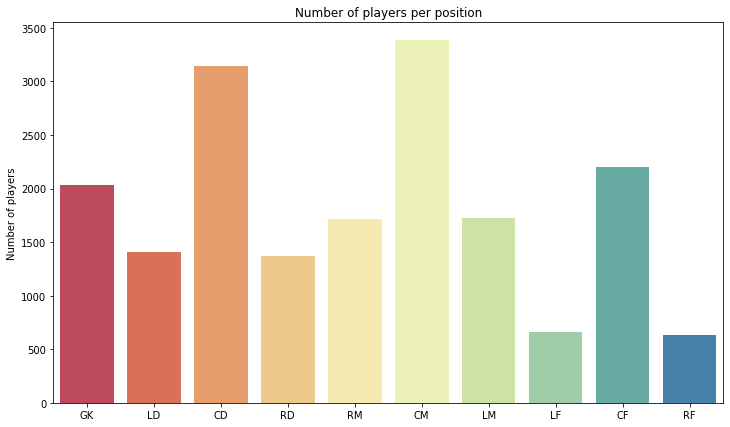

In [50]:
# and plotting them

plt.figure(figsize=(12,7))
sns.barplot(x='team_position', y='sofifa_id', data=groups_df, palette='Spectral', 
            order=['GK', 'LD', 'CD', 'RD', 'RM', 'CM', 'LM', 'LF', 'CF', 'RF'])  
plt.xlabel('')
plt.ylabel('Number of players')
plt.title('Number of players per position')
plt.show()

### Boxplots

In [23]:
feats = ['attacking_crossing', 'attacking_finishing', 'attacking_volleys', 
          'skill_dribbling', 'skill_long_passing', 'skill_ball_control', 
          'movement_sprint_speed', 'movement_agility', 'movement_reactions',
          'power_shot_power','power_stamina', 'power_strength', 
          'mentality_aggression', 'mentality_positioning', 'mentality_vision',  
          'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle', 
          'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_reflexes', 'overall']

In [24]:
df_stats['team_position'].unique()

array(['RF', 'LF', 'CM', 'GK', 'RM', 'CD', 'CF', 'LM', 'LD', 'RD'],
      dtype=object)

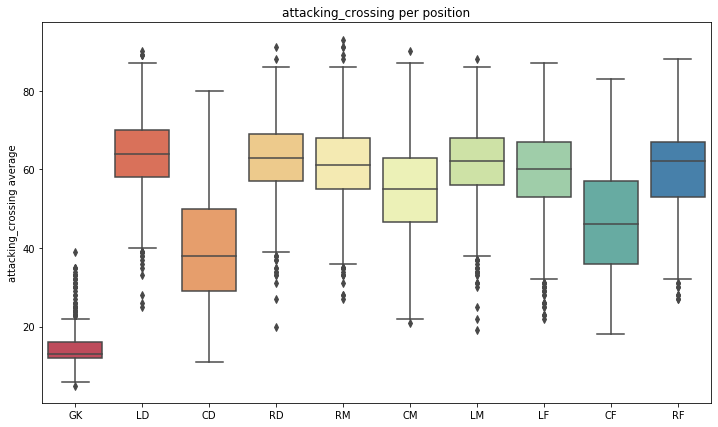

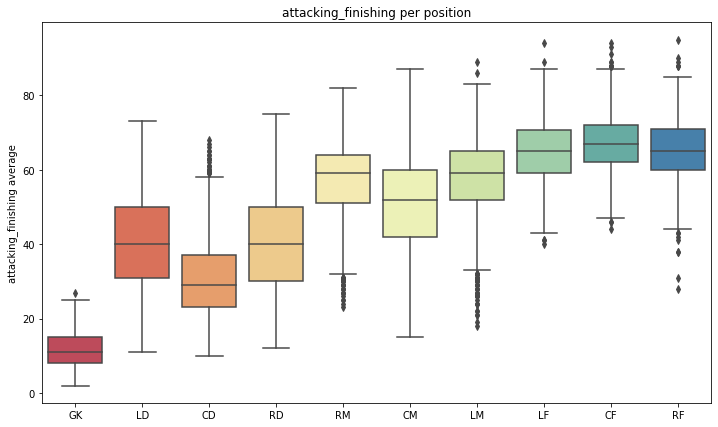

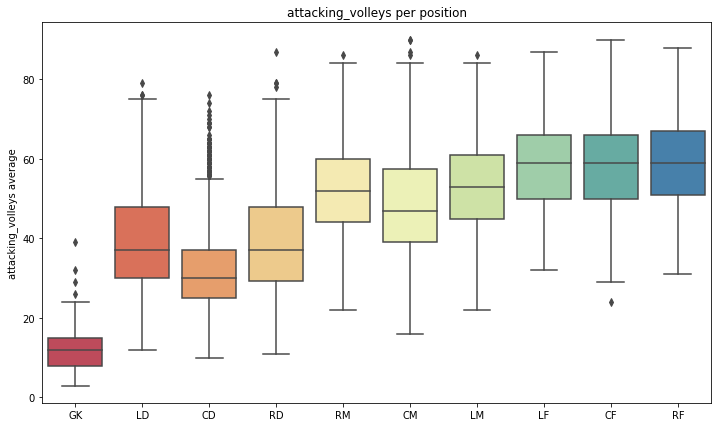

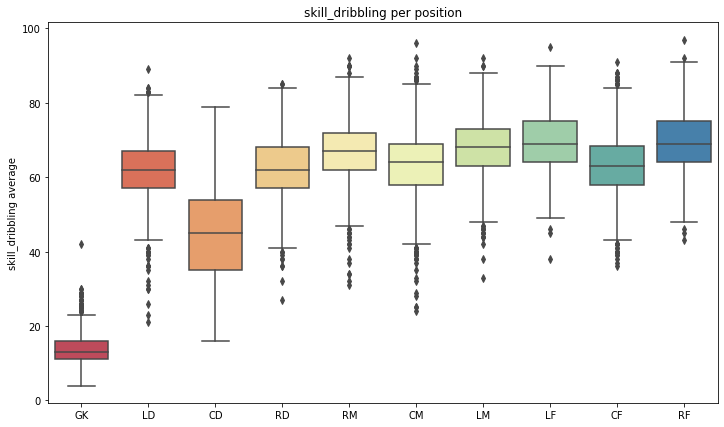

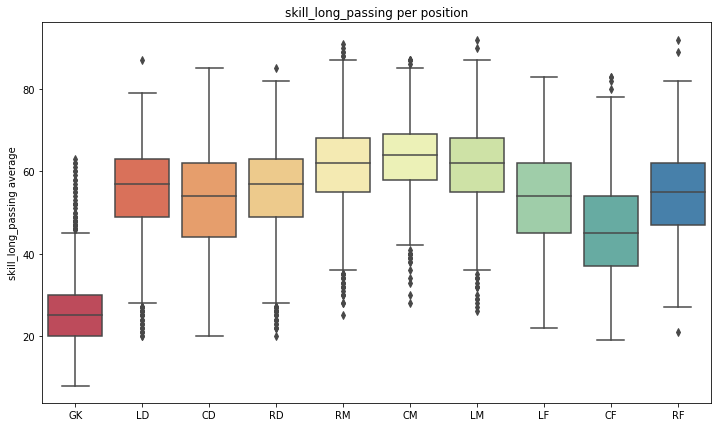

...

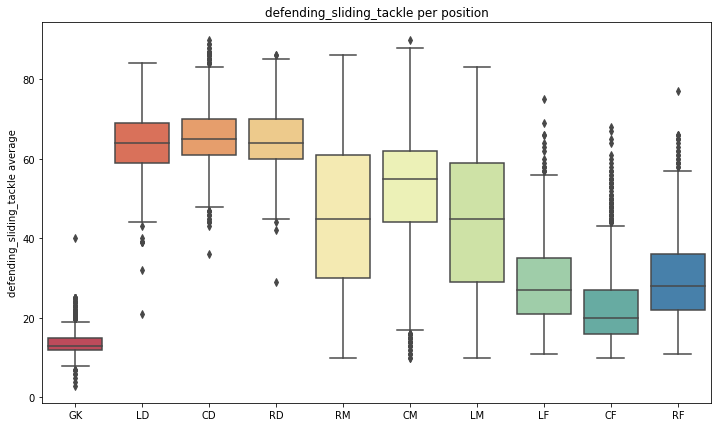

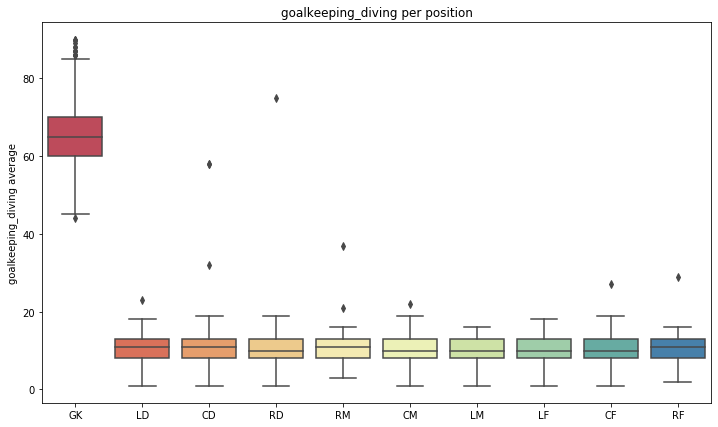

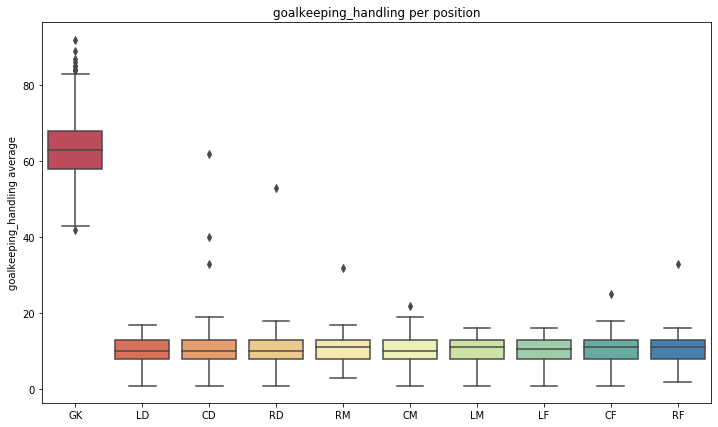

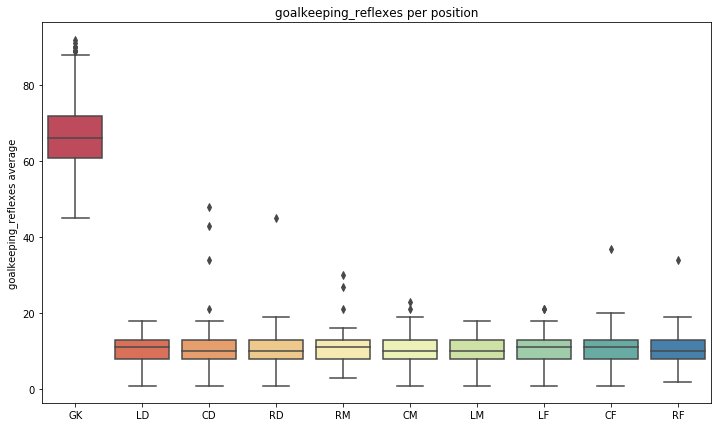

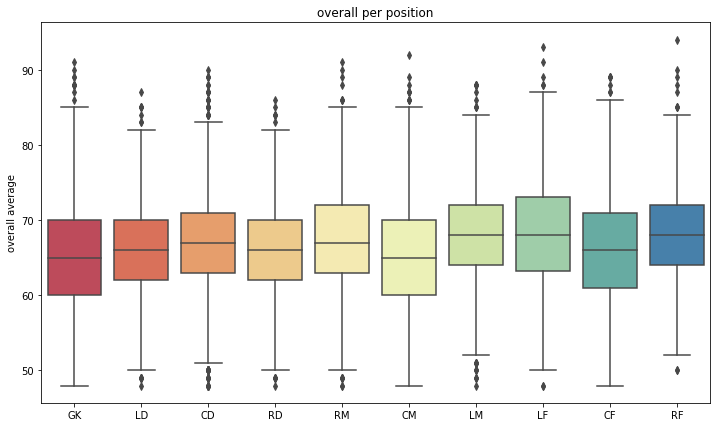

In [25]:
for feat in feats:
    
    plt.figure(figsize=(12,7))
    sns.boxplot(x='team_position', y=feat, data=df_stats, palette='Spectral', 
                order=['GK', 'LD', 'CD', 'RD', 'RM', 'CM', 'LM', 'LF', 'CF', 'RF'])  
    plt.xlabel('')
    plt.ylabel('{} average'.format(feat))
    plt.title('{} per position'.format(feat))
    plt.show()

### Scatterplots

In [26]:
# Before plotting the scatter plots, we join positions in goalkeeper, defender, midfielder and forward

GK = ['GK']
DEF =['LD', 'CD', 'RD']
MID = ['LM', 'CM', 'RM']
FWD = ['LF', 'CF', 'RF']

def general_position(x):
    if x in DEF:
        return 'Defenders'
    elif x in MID:
        return 'Midfielders'
    elif x in FWD:
        return 'Forwards'
    elif x in GK:
        return 'Goalkeepers'

In [27]:
df_stats['general_position'] = df_stats['team_position'].apply(general_position)

df_stats['general_position'].value_counts()

Midfielders    6823
Defenders      5926
Forwards       3493
Goalkeepers    2036
Name: general_position, dtype: int64

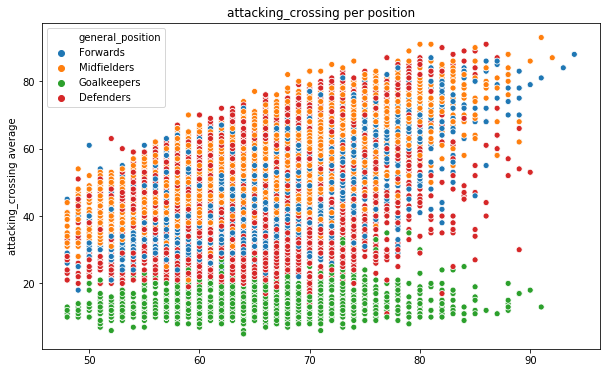

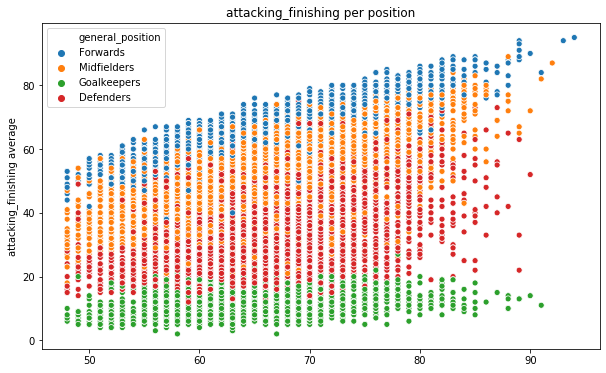

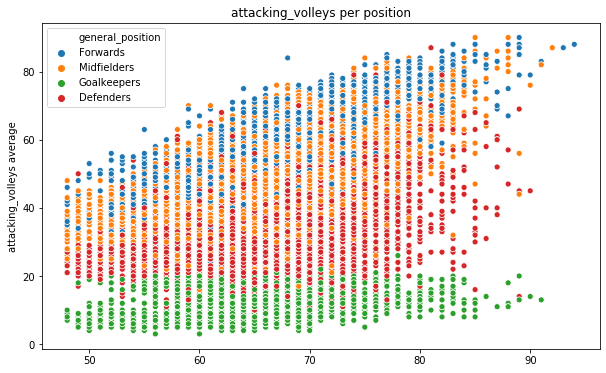

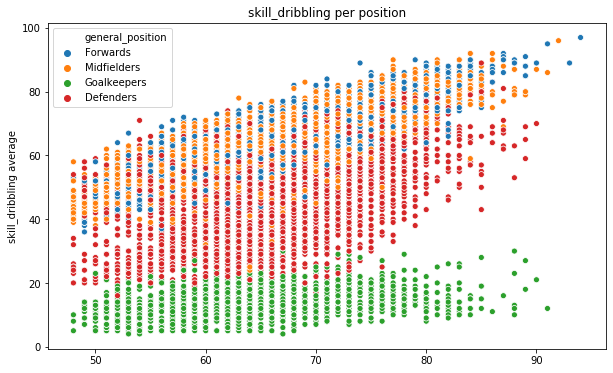

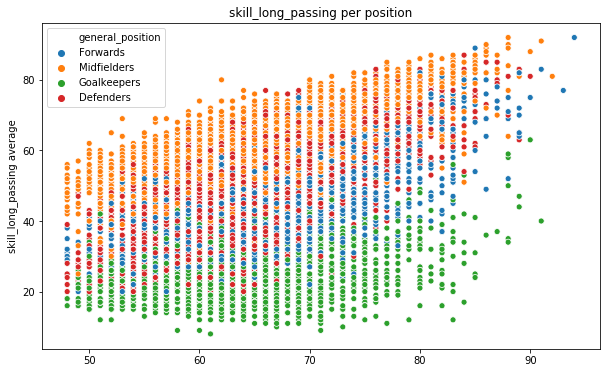

...

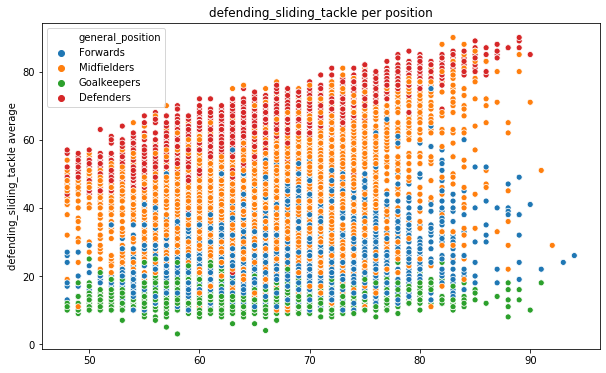

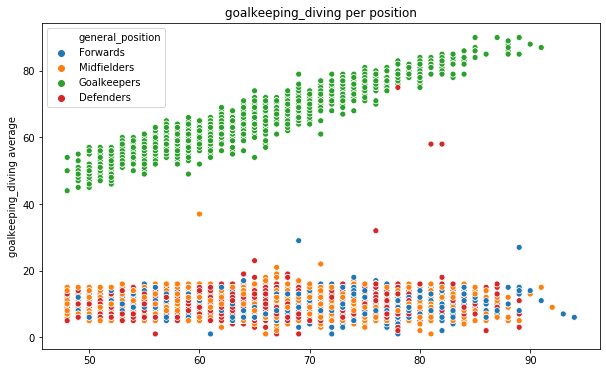

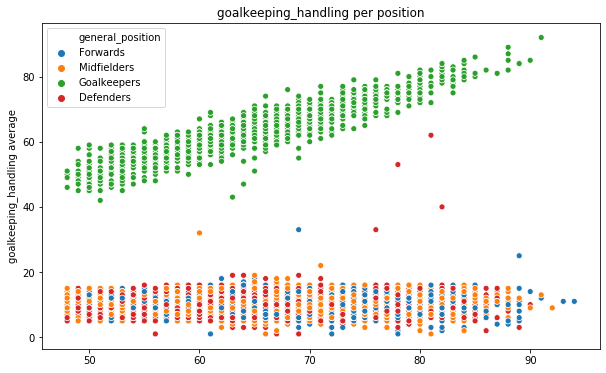

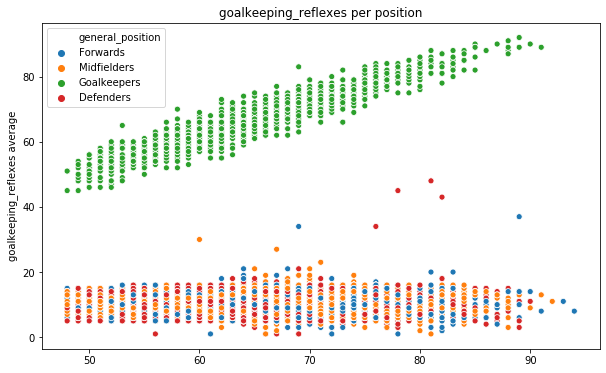

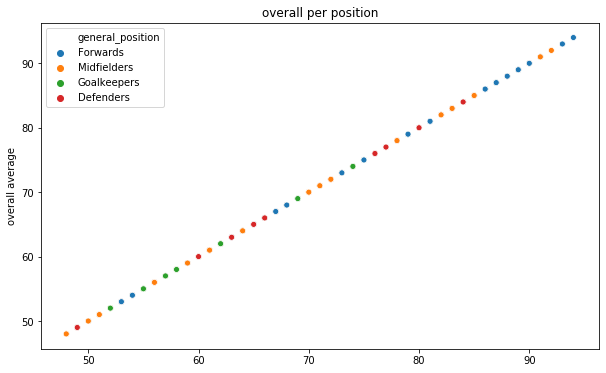

In [28]:
for feat in feats:
    plt.figure(figsize=(10,6))
    sns.scatterplot(data=df_stats, x='overall', y=feat, hue='general_position')
    plt.xlabel('')
    plt.ylabel('{} average'.format(feat))
    plt.title('{} per position'.format(feat))
    plt.show()

### Radar plot

In [29]:
radar_df = df_stats.groupby('team_position', as_index=False).agg('mean')
radar_df

,team_position,sofifa_id,age,value_eur,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,...,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall
0,CD,217920.707790,25.862003,2.361787e+06,40.545628,30.718601,65.634340,57.542448,32.207949,44.648967,...,58.545310,65.057870,67.549126,65.253736,10.520827,10.524324,10.510970,10.555167,10.488712,66.712242
1,CF,220678.817522,24.973672,2.441791e+06,46.451657,66.688153,63.587381,58.328189,58.192011,63.204721,...,60.428507,28.482978,25.586473,22.850204,10.359510,10.484793,10.536995,10.426237,10.517022,65.874716
2,CM,223664.029560,24.342891,2.263422e+06,55.082471,50.981082,52.462607,67.316879,48.343482,63.403192,...,61.143068,52.832988,55.178540,52.571091,10.330772,10.383979,10.428022,10.472066,10.420337,65.227904
3,GK,213512.369352,26.266699,1.728016e+06,14.120334,11.598723,14.138016,26.993615,11.978880,13.636542,...,43.116405,14.694499,13.946464,13.826130,65.422397,63.146365,61.832515,63.374754,66.390472,64.796660
4,LD,221808.840796,25.213930,1.758785e+06,63.616915,40.683724,55.053305,61.542999,39.542999,62.066809,...,57.972281,61.611940,64.895522,63.977257,10.614783,10.420043,10.422175,10.312011,10.474058,65.636816
5,LF,221109.597264,24.819149,4.332736e+06,59.007599,65.025836,54.267477,63.530395,58.238602,69.626140,...,63.118541,34.340426,31.682371,29.234043,10.364742,10.396657,10.621581,10.310030,10.635258,68.113982
6,LM,219087.132021,25.351477,3.133011e+06,61.661262,57.602779,51.565721,66.450492,52.848292,67.879560,...,62.575565,47.266937,47.209612,44.632310,10.396063,10.476549,10.387377,10.484655,10.423277,67.670527
7,RD,220515.652111,25.452693,1.825990e+06,62.855167,40.440320,55.777293,61.743814,39.093886,62.076419,...,58.494905,62.266376,65.413392,64.517467,10.558952,10.602620,10.532751,10.465793,10.457787,66.005095
8,RF,219753.609177,25.087025,4.460696e+06,59.976266,65.028481,54.613924,63.623418,58.444620,69.398734,...,63.169304,34.286392,32.716772,30.137658,10.509494,10.609177,10.523734,10.289557,10.457278,68.199367
9,RM,219318.674839,25.410391,3.126929e+06,61.131349,56.928196,51.581436,66.220665,52.051956,66.988908,...,62.140105,47.962639,48.252189,45.541156,10.507297,10.609457,10.616462,10.664915,10.584355,67.409224


In [30]:
labels = ['attacking_crossing', 'attacking_finishing', 
           'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 
           'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration',
           'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power',
           'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression',
           'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 
           'mentality_composure', 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle', 
           'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 
           'goalkeeping_reflexes']

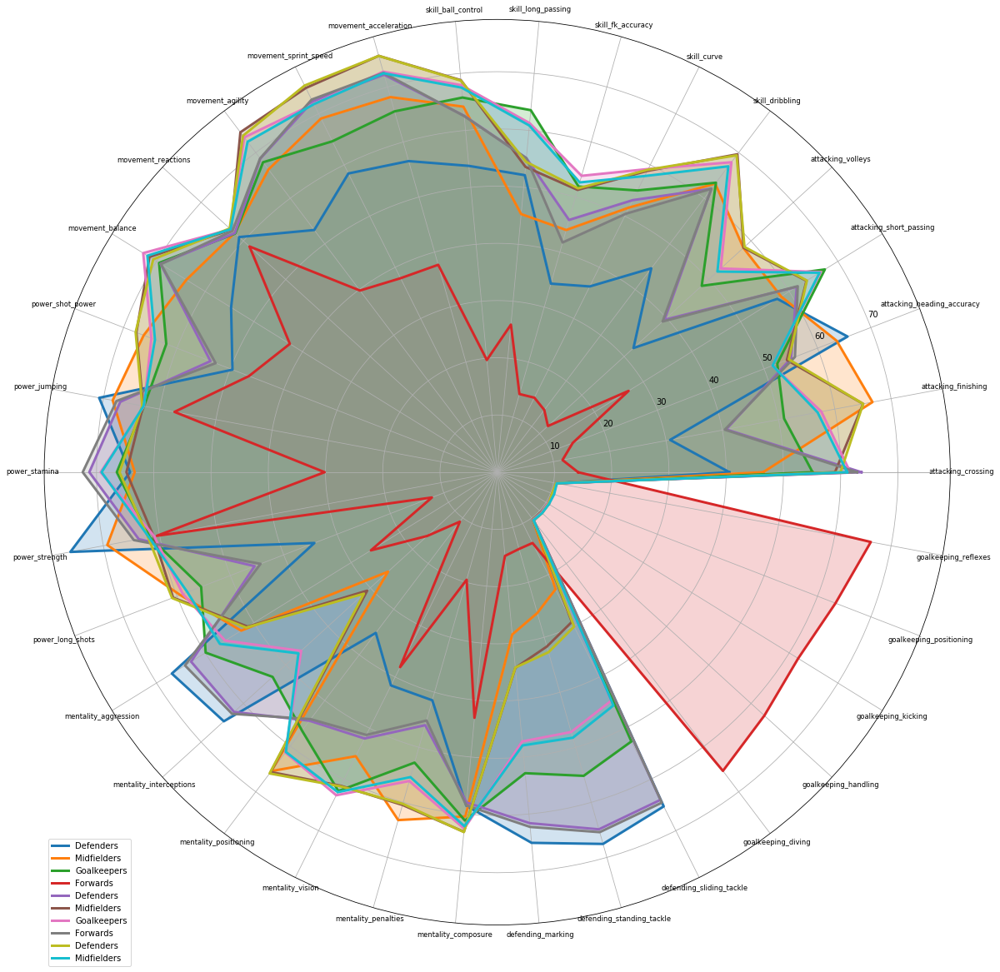

In [31]:

#Values and angles
stats0=radar_df.loc[0,labels].values
angles0=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats1=radar_df.loc[1,labels].values
angles1=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats2=radar_df.loc[2,labels].values
angles2=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats3=radar_df.loc[3,labels].values
angles3=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats4=radar_df.loc[4,labels].values
angles4=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats5=radar_df.loc[5,labels].values
angles5=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats6=radar_df.loc[6,labels].values
angles6=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats7=radar_df.loc[7,labels].values
angles7=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats8=radar_df.loc[8,labels].values
angles8=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats9=radar_df.loc[9,labels].values
angles9=np.linspace(0, 2*np.pi, len(labels), endpoint=False)




# close the plot
stats0=np.concatenate((stats0,[stats0[0]]))
angles0=np.concatenate((angles0,[angles0[0]]))

stats1=np.concatenate((stats1,[stats1[0]]))
angles1=np.concatenate((angles1,[angles1[0]]))

stats2=np.concatenate((stats2,[stats2[0]]))
angles2=np.concatenate((angles2,[angles2[0]]))

stats3=np.concatenate((stats3,[stats3[0]]))
angles3=np.concatenate((angles3,[angles3[0]]))

stats4=np.concatenate((stats4,[stats4[0]]))
angles4=np.concatenate((angles4,[angles4[0]]))

stats5=np.concatenate((stats5,[stats5[0]]))
angles5=np.concatenate((angles5,[angles5[0]]))

stats6=np.concatenate((stats6,[stats6[0]]))
angles6=np.concatenate((angles6,[angles6[0]]))

stats7=np.concatenate((stats7,[stats7[0]]))
angles7=np.concatenate((angles7,[angles7[0]]))

stats0=np.concatenate((stats0,[stats0[0]]))
angles0=np.concatenate((angles0,[angles0[0]]))

stats8=np.concatenate((stats8,[stats8[0]]))
angles8=np.concatenate((angles8,[angles8[0]]))

stats9=np.concatenate((stats9,[stats9[0]]))
angles9=np.concatenate((angles9,[angles9[0]]))



#Plot matrix
fig=plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, polar=True)

ax.plot(angles0, stats0, linewidth=3, label="Defenders")
ax.fill(angles0, stats0, alpha=0.2)

ax.plot(angles1, stats1, linewidth=3, label="Midfielders")
ax.fill(angles1, stats1, alpha=0.2)

ax.plot(angles2, stats2, linewidth=3, label="Goalkeepers")
ax.fill(angles2, stats2, alpha=0.2)

ax.plot(angles3, stats3, linewidth=3, label="Forwards")
ax.fill(angles3, stats3, alpha=0.2)

ax.plot(angles4, stats4, linewidth=3, label="Defenders")
ax.fill(angles4, stats4, alpha=0.2)

ax.plot(angles5, stats5, linewidth=3, label="Midfielders")
ax.fill(angles5, stats5, alpha=0.2)

ax.plot(angles6, stats6, linewidth=3, label="Goalkeepers")
ax.fill(angles6, stats6, alpha=0.2)

ax.plot(angles7, stats7, linewidth=3, label="Forwards")
ax.fill(angles7, stats7, alpha=0.2)

ax.plot(angles8, stats8, linewidth=3, label="Defenders")
ax.fill(angles8, stats8, alpha=0.2)

ax.plot(angles9, stats9, linewidth=3, label="Midfielders")
ax.fill(angles9, stats9, alpha=0.2)


plt.legend(bbox_to_anchor=(0.1, 0.1))

ax.set_thetagrids(angles0 * 180/np.pi, labels, size='small')

ax.grid(True)

In [32]:
# Too many lines, let's plot general_positions

radar_df4 = df_stats.groupby('general_position', as_index=False).agg('mean')
radar_df4

,general_position,sofifa_id,age,value_eur,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,...,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,overall
0,Defenders,219445.523287,25.613230,2.094387e+06,51.196085,35.338677,60.836652,59.466419,35.546068,52.825177,...,58.397570,63.592474,66.423895,64.779953,10.551974,10.517719,10.494938,10.476713,10.478063,66.292946
1,Forwards,220592.565417,24.965073,3.163288e+06,51.263956,66.074721,60.208131,60.266247,58.246493,65.535070,...,61.431148,30.636416,28.024907,25.371314,10.387632,10.490696,10.550530,10.379616,10.528486,66.717149
2,Goalkeepers,213512.369352,26.266699,1.728016e+06,14.120334,11.598723,14.138016,26.993615,11.978880,13.636542,...,43.116405,14.694499,13.946464,13.826130,65.422397,63.146365,61.832515,63.374754,66.390472,64.796660
3,Midfielders,221414.594606,24.866188,2.700322e+06,58.266305,54.150227,52.014363,66.822366,50.414774,65.436465,...,61.755972,50.201378,51.422541,48.796717,10.391617,10.464019,10.465045,10.523670,10.462260,66.393815


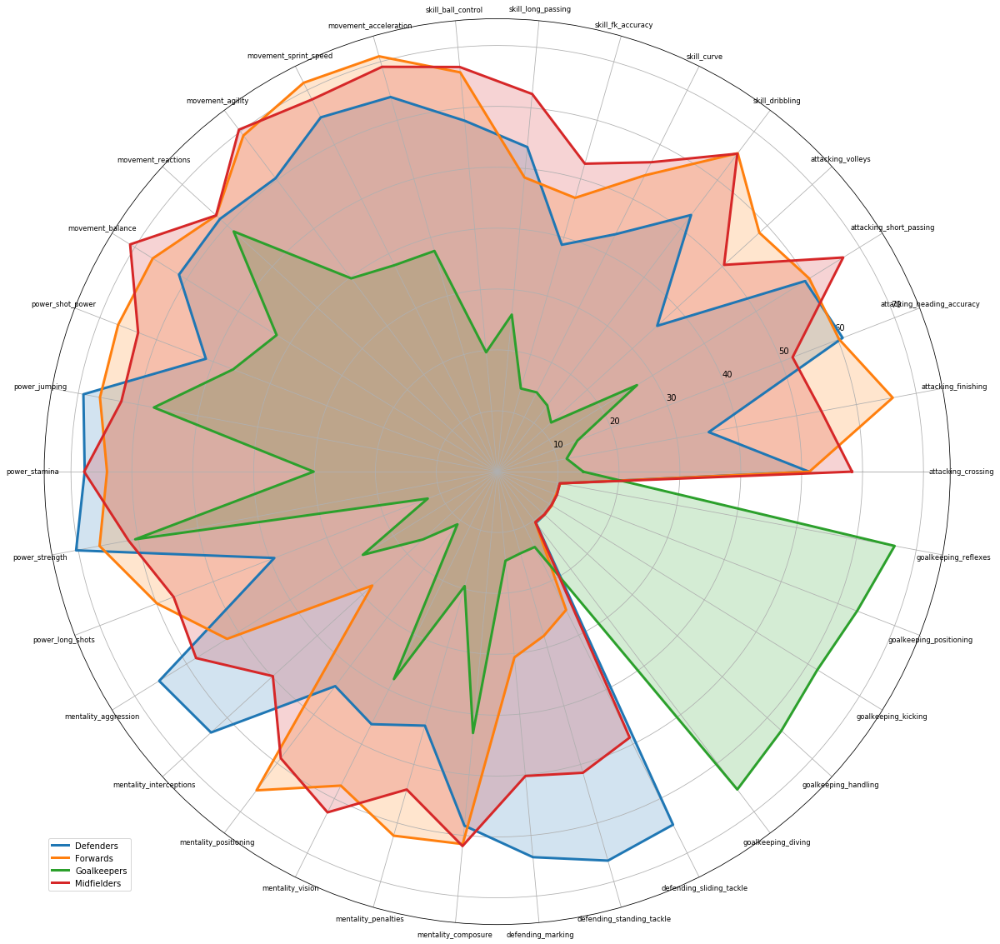

In [33]:
#Values and angles
stats0=radar_df4.loc[0,labels].values
angles0=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats1=radar_df4.loc[1,labels].values
angles1=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats2=radar_df4.loc[2,labels].values
angles2=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

stats3=radar_df4.loc[3,labels].values
angles3=np.linspace(0, 2*np.pi, len(labels), endpoint=False)




# close the plot
stats0=np.concatenate((stats0,[stats0[0]]))
angles0=np.concatenate((angles0,[angles0[0]]))

stats1=np.concatenate((stats1,[stats1[0]]))
angles1=np.concatenate((angles1,[angles1[0]]))

stats2=np.concatenate((stats2,[stats2[0]]))
angles2=np.concatenate((angles2,[angles2[0]]))

stats3=np.concatenate((stats3,[stats3[0]]))
angles3=np.concatenate((angles3,[angles3[0]]))



#Plot matrix
fig=plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, polar=True)

ax.plot(angles0, stats0, linewidth=3, label="Defenders")
ax.fill(angles0, stats0, alpha=0.2)

ax.plot(angles1, stats1, linewidth=3, label="Forwards")
ax.fill(angles1, stats1, alpha=0.2)

ax.plot(angles2, stats2, linewidth=3, label="Goalkeepers")
ax.fill(angles2, stats2, alpha=0.2)

ax.plot(angles3, stats3, linewidth=3, label="Midfielders")
ax.fill(angles3, stats3, alpha=0.2)



plt.legend(bbox_to_anchor=(0.1, 0.1))

ax.set_thetagrids(angles0 * 180/np.pi, labels, size='small')

ax.grid(True)

### Radar plots per position

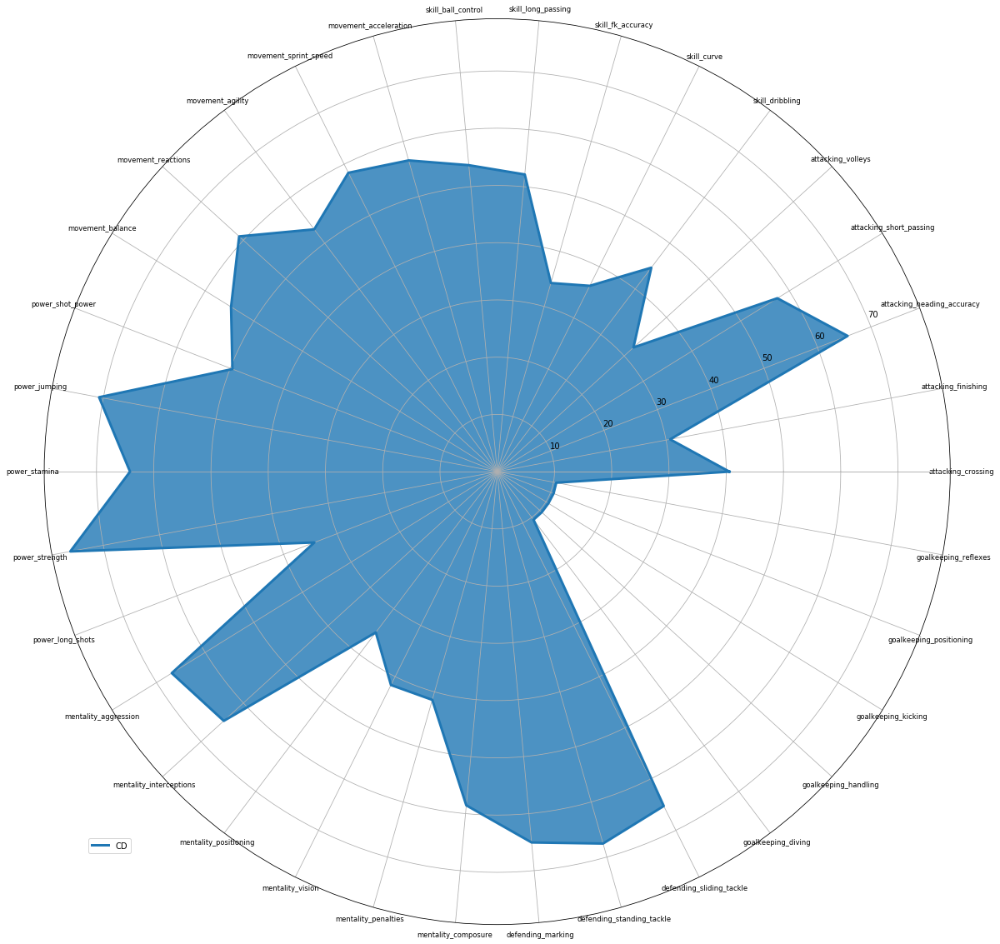

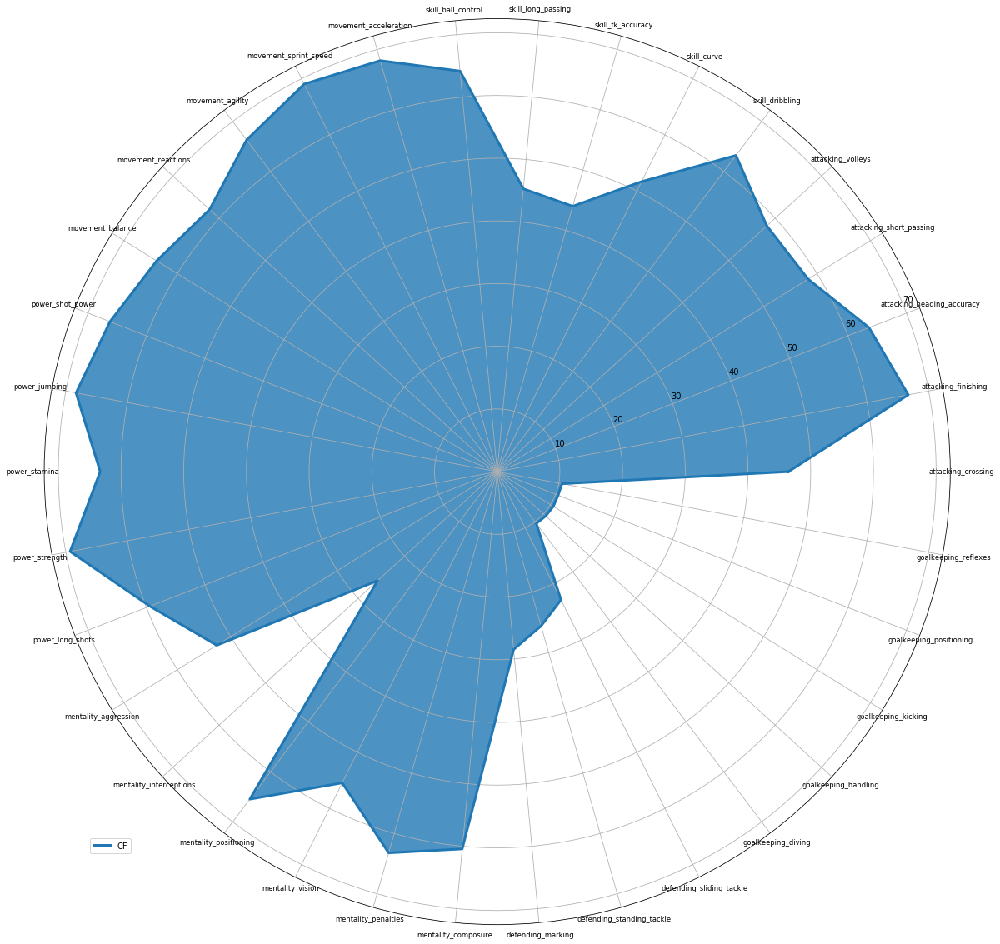

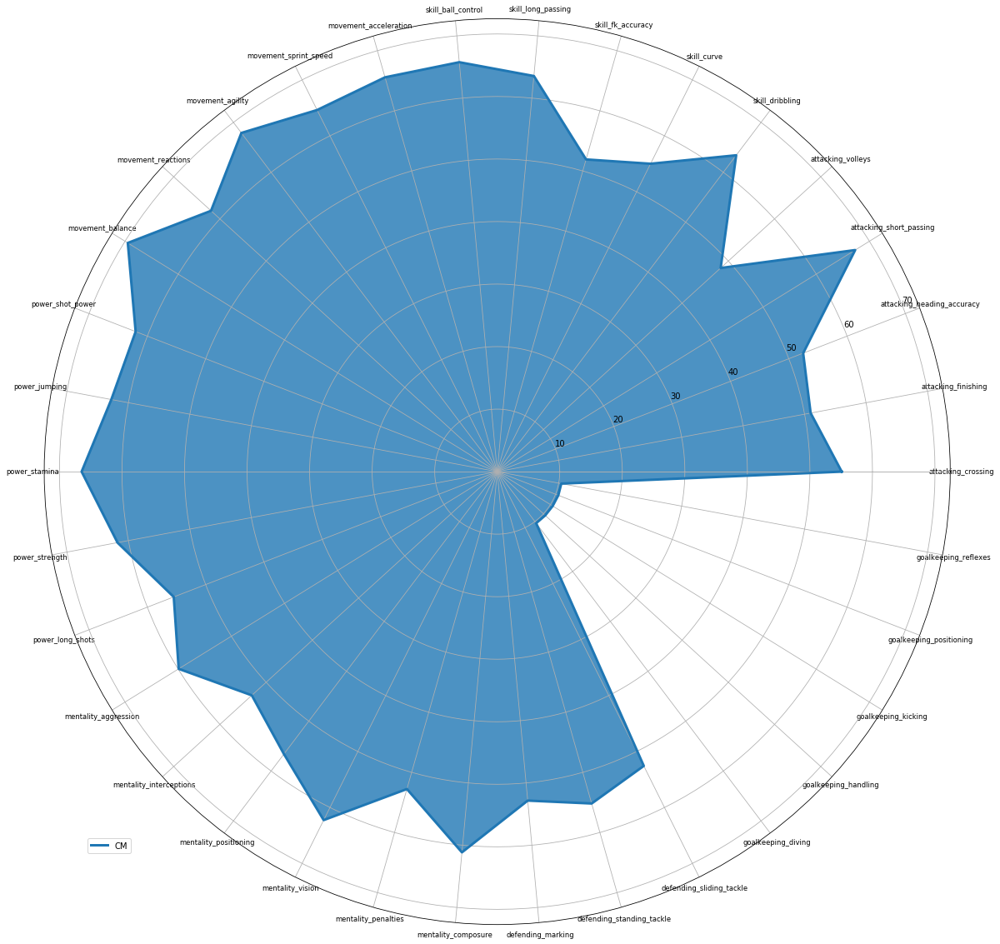

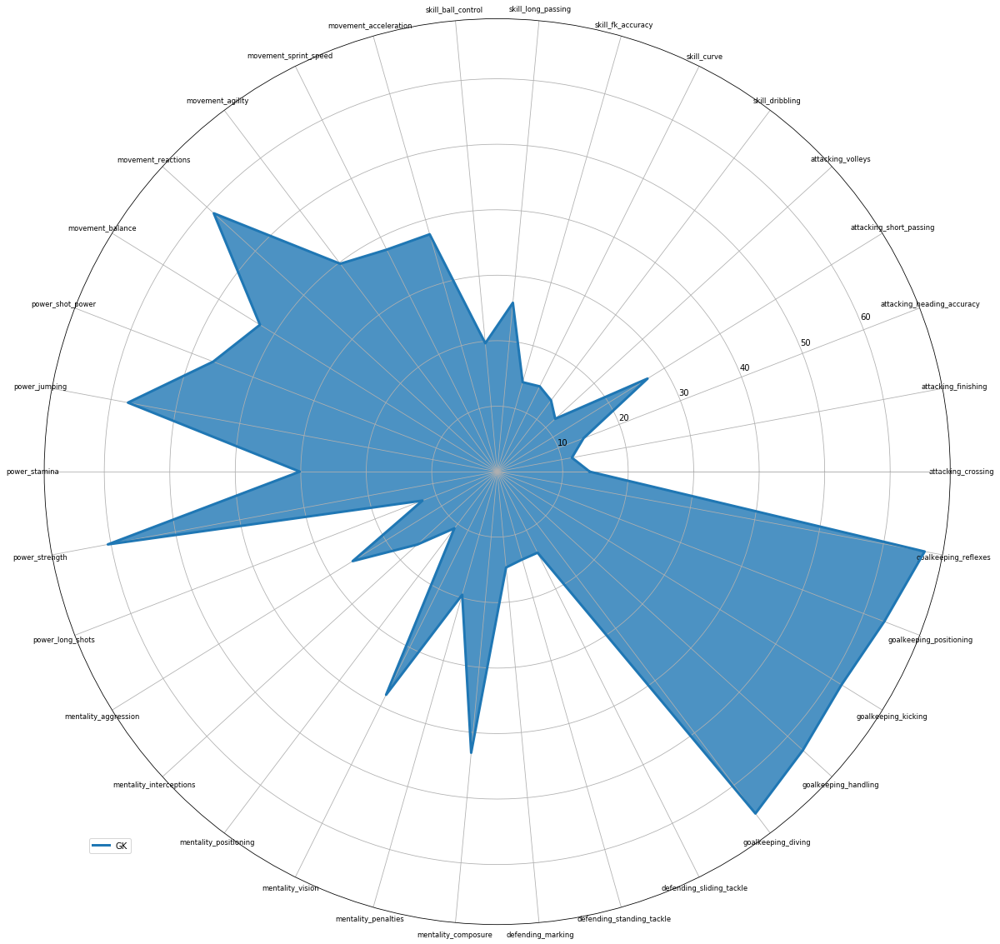

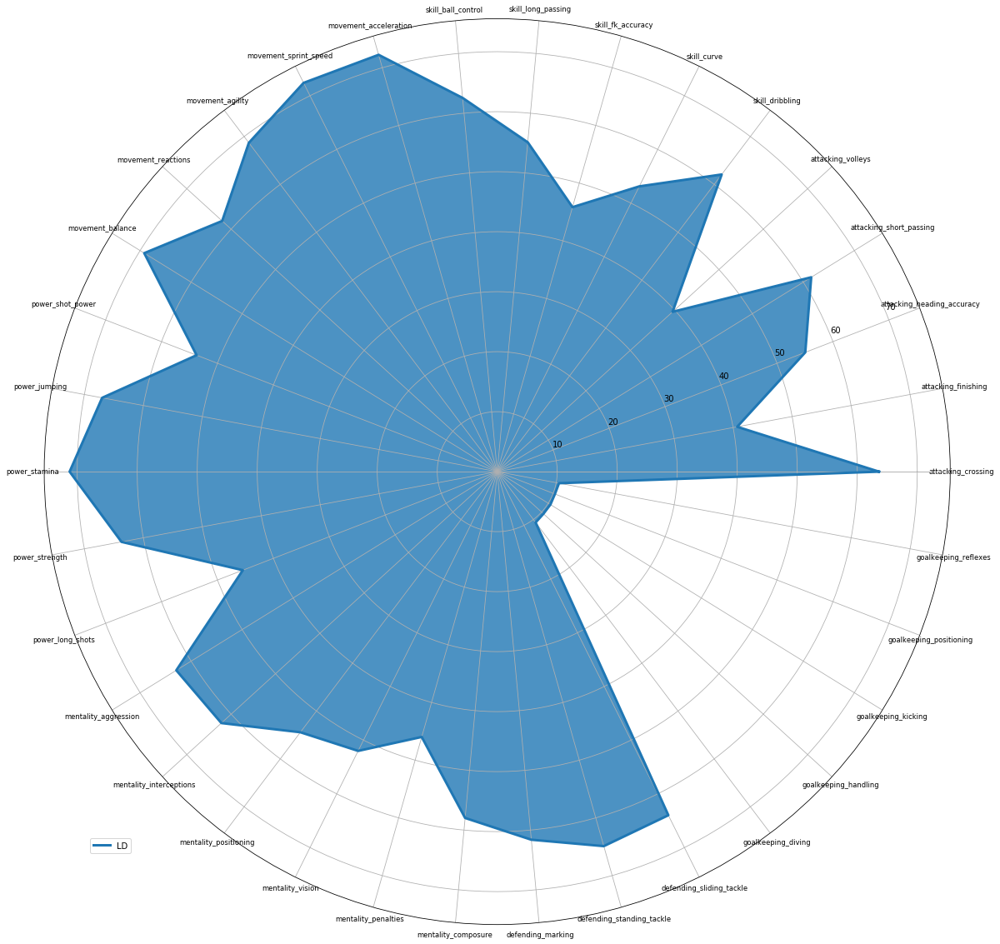

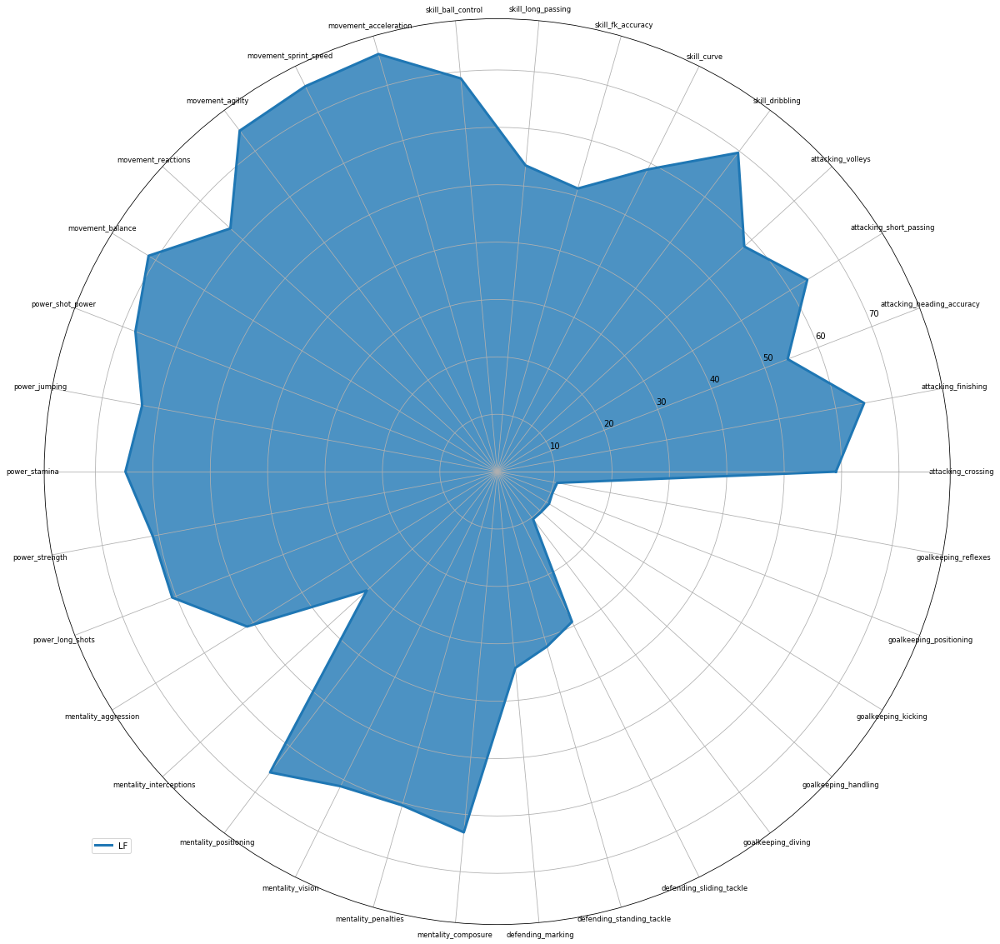

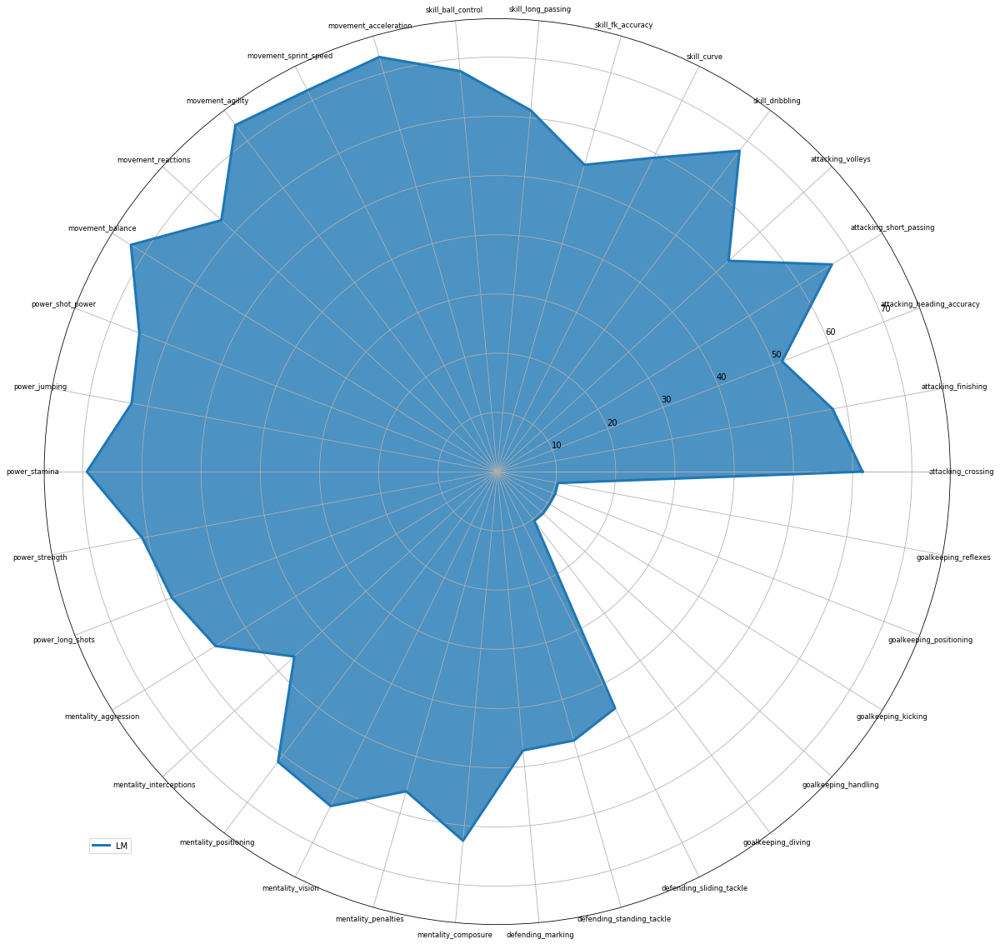

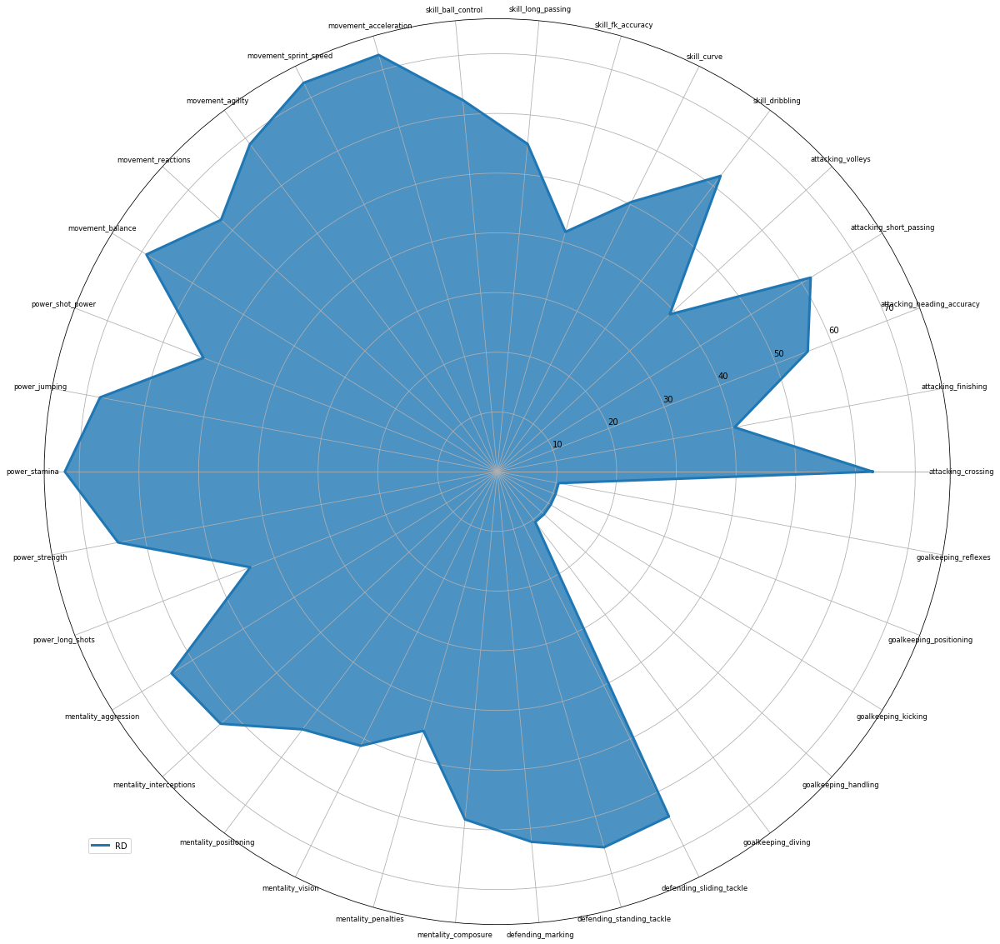

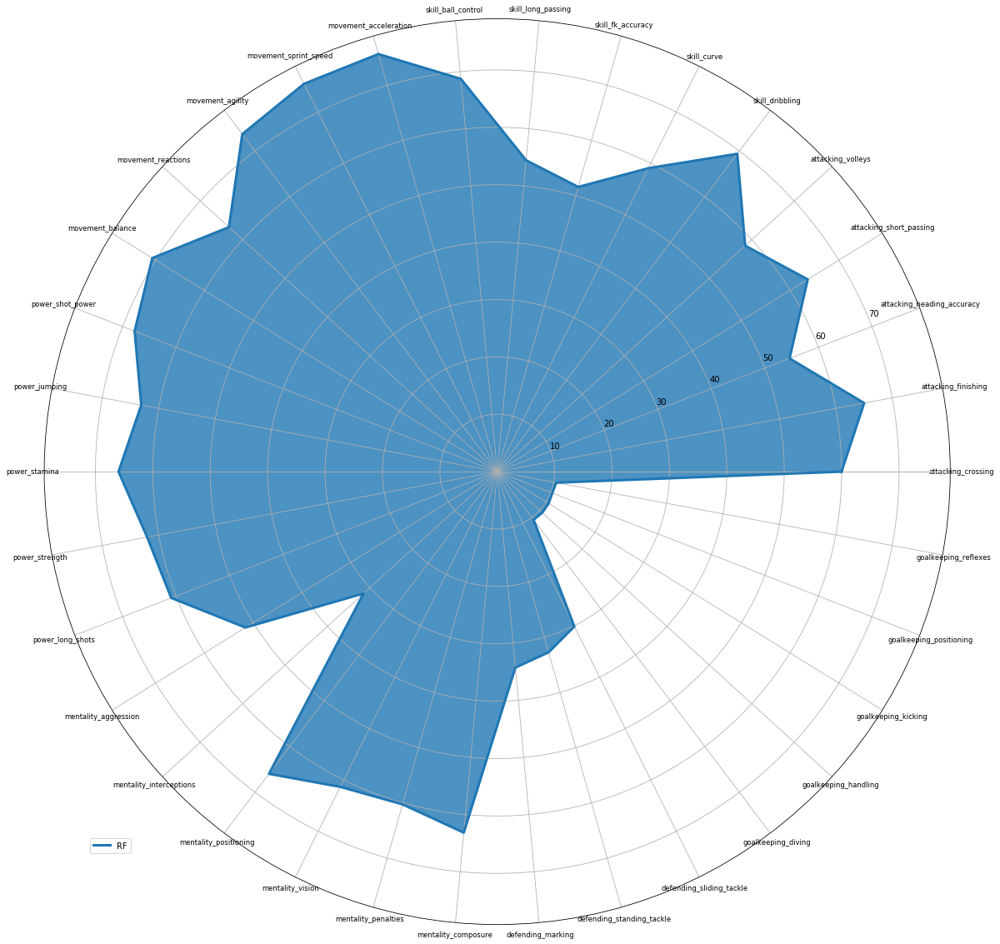

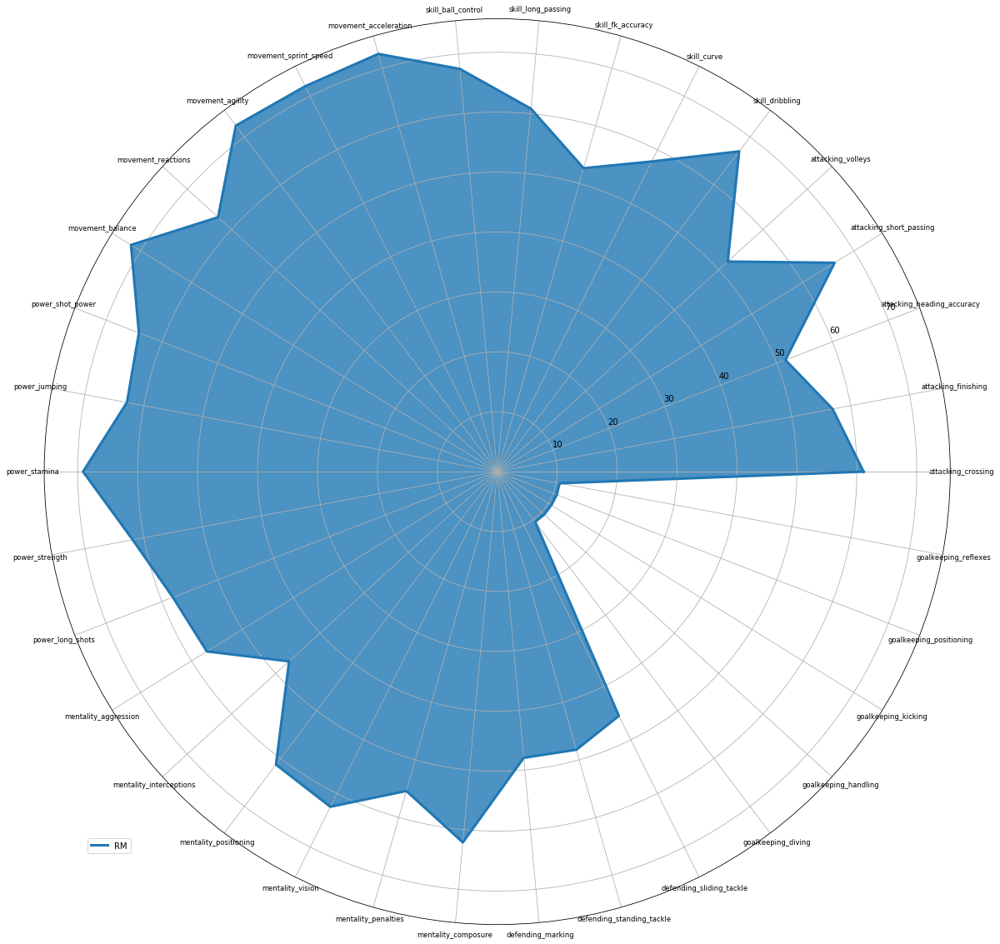

In [34]:
pos = ['CD', 'CF', 'CM', 'GK', 'LD', 'LF', 'LM', 'RD', 'RF', 'RM']

for i in range(10):
    
    stats=radar_df.loc[i,labels].values
    angles=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

    stats=np.concatenate((stats,[stats[0]]))
    angles=np.concatenate((angles,[angles[0]]))

    fig=plt.figure(figsize=(20,20))
    ax = fig.add_subplot(111, polar=True)

    ax.plot(angles, stats, linewidth=3, label=pos[i])
    ax.fill(angles, stats, alpha=0.8)


    plt.legend(bbox_to_anchor=(0.1, 0.1))

    ax.set_thetagrids(angles * 180/np.pi, labels, size='small')

    ax.grid(True)

### Radar plot 4 main positions

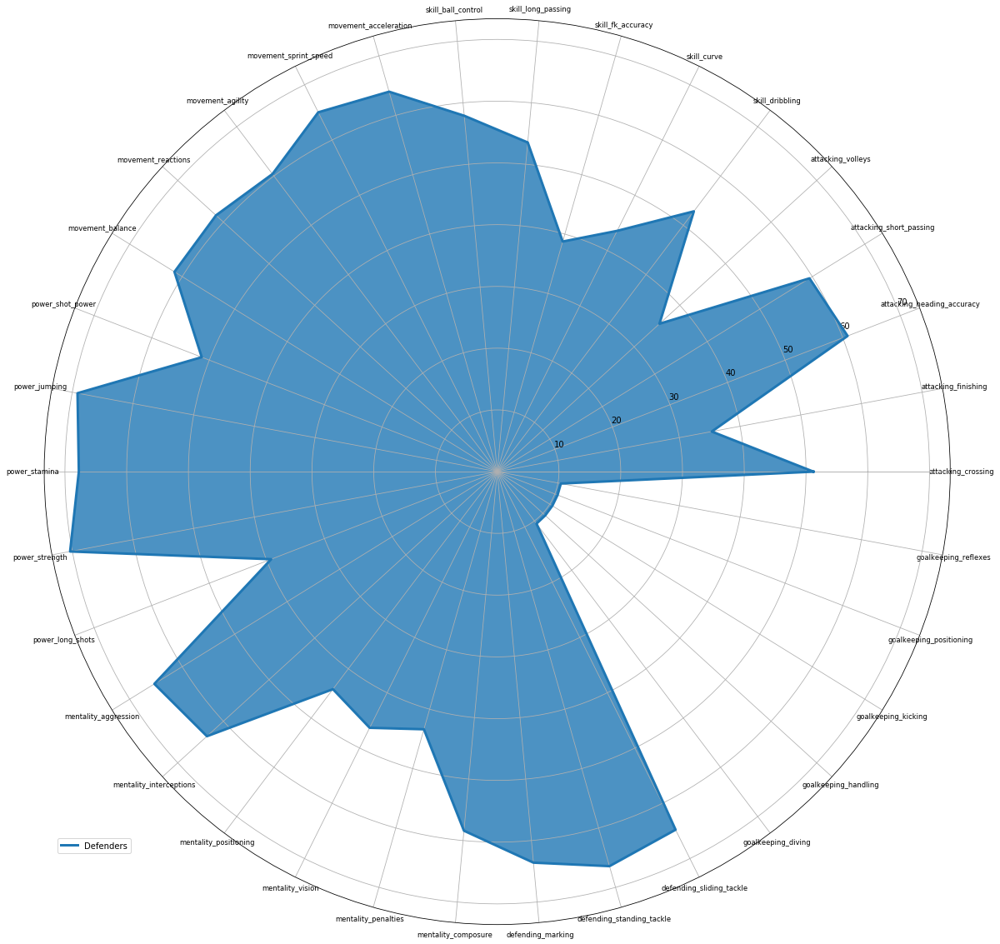

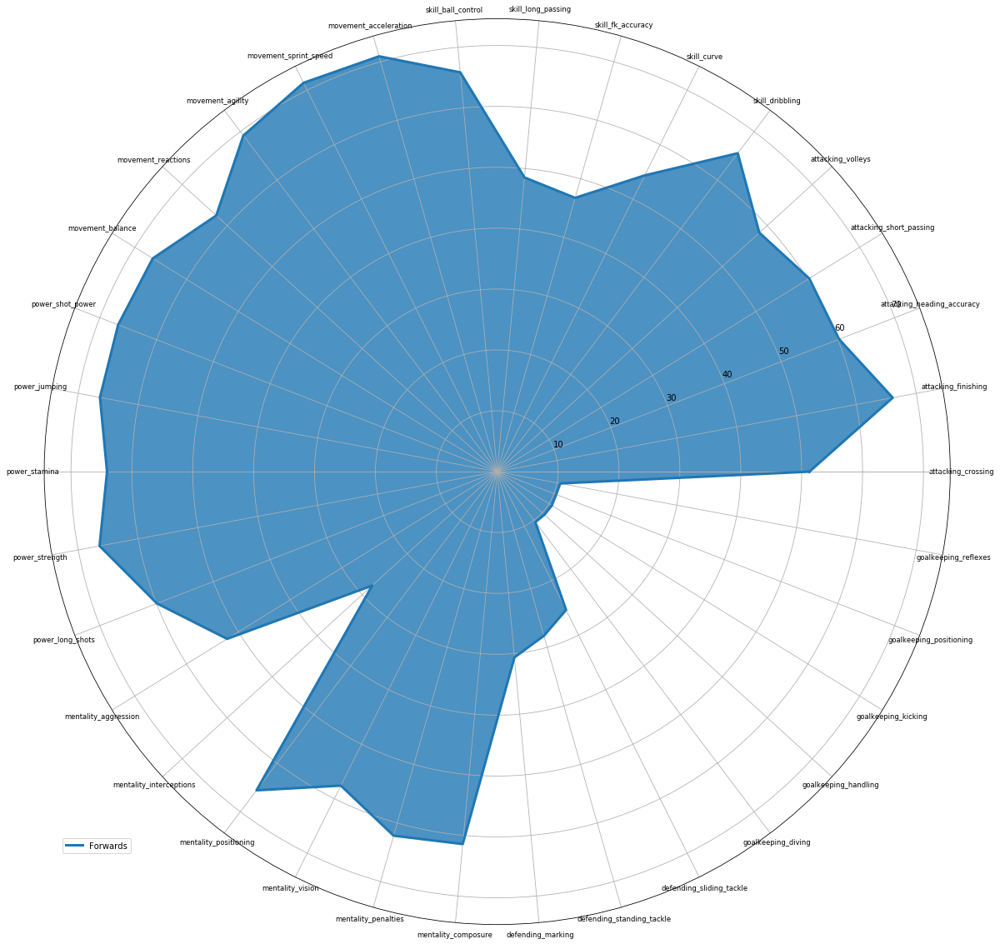

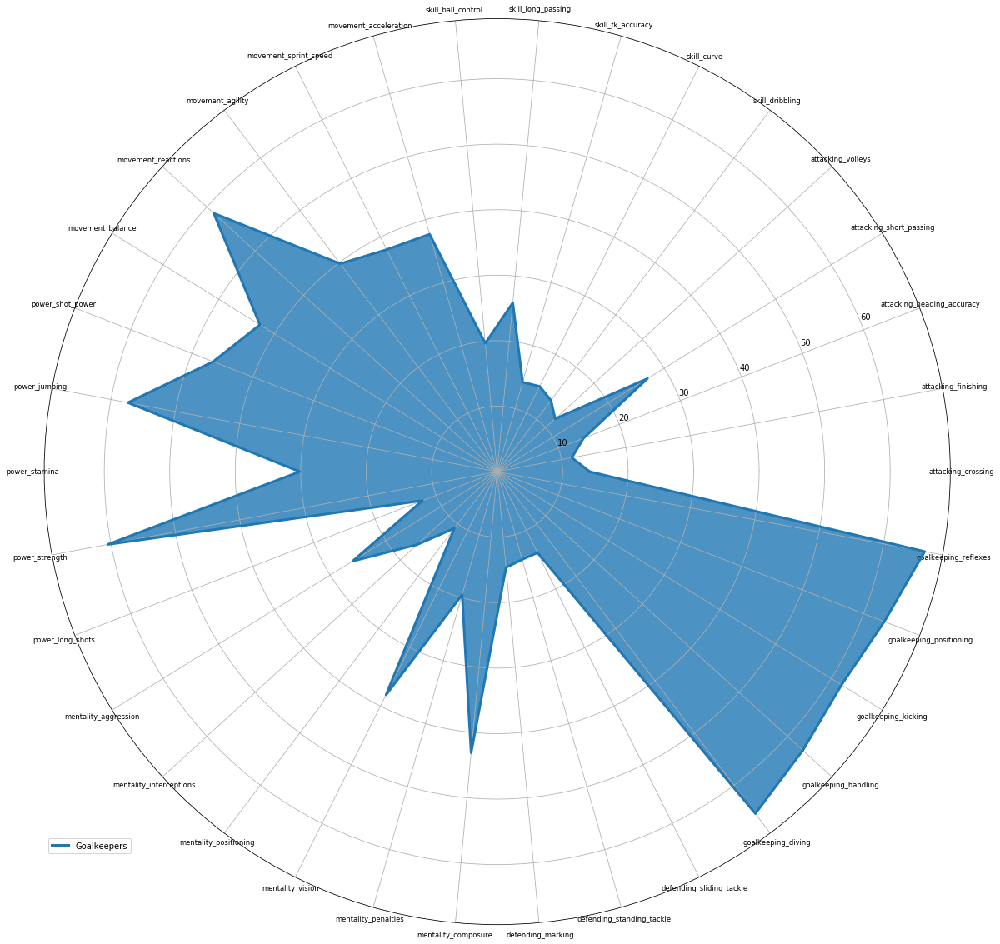

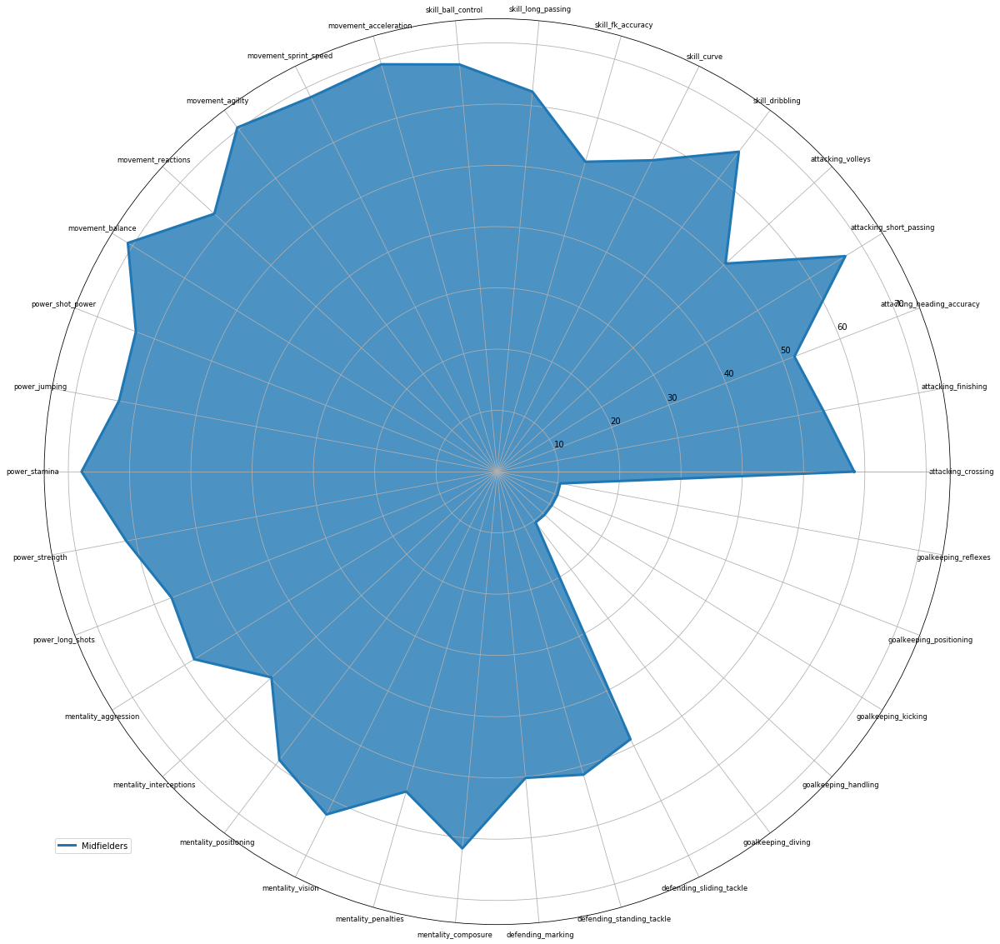

In [35]:
pos = ['Defenders', 'Forwards', 'Goalkeepers', 'Midfielders']

for i in range(4):
    
    stats=radar_df4.loc[i,labels].values
    angles=np.linspace(0, 2*np.pi, len(labels), endpoint=False)

    stats=np.concatenate((stats,[stats[0]]))
    angles=np.concatenate((angles,[angles[0]]))

    fig=plt.figure(figsize=(20,20))
    ax = fig.add_subplot(111, polar=True)

    ax.plot(angles, stats, linewidth=3, label=pos[i])
    ax.fill(angles, stats, alpha=0.8)


    plt.legend(bbox_to_anchor=(0.1, 0.1))

    ax.set_thetagrids(angles * 180/np.pi, labels, size='small')

    ax.grid(True)

## Looking for young players with higher potential for each position

In [36]:
#Building new dataframe with the features we need to plot young players

df_young = df[['sofifa_id', 'short_name', 'age', 'club', 'value_eur', 'overall', 'potential']]
df_young['team_position'] = df_stats['team_position']
df_young['general_position'] = df_stats['general_position']
df_young = df_young.loc[df_young['age']<22]
df_young.head()

,sofifa_id,short_name,age,club,value_eur,overall,potential,team_position,general_position
10,231747,K. Mbappé,20,Paris Saint-Germain,93500000,89,95,RF,Forwards
73,235243,M. de Ligt,19,Juventus,50000000,85,93,CD,Defenders
74,230621,G. Donnarumma,20,Milan,41500000,85,92,GK,Goalkeepers
108,233049,J. Sancho,19,Borussia Dortmund,44500000,84,92,RM,Midfielders
109,235790,K. Havertz,20,Bayer 04 Leverkusen,46000000,84,92,RF,Forwards


In [37]:
df_young['team_position'].unique()

array(['RF', 'CD', 'GK', 'RM', 'RD', 'CF', 'LM', 'CM', 'LF', 'LD'],
      dtype=object)

In [38]:
# Separating positions in DFs

df_gk = df_young.loc[df_young['team_position']=='GK']
df_ld = df_young.loc[df_young['team_position']=='LD']
df_cd = df_young.loc[df_young['team_position']=='CD']
df_rd = df_young.loc[df_young['team_position']=='RD']
df_lm = df_young.loc[df_young['team_position']=='LM']
df_cm = df_young.loc[df_young['team_position']=='CM']
df_rm = df_young.loc[df_young['team_position']=='RM']
df_lf = df_young.loc[df_young['team_position']=='LF']
df_cf = df_young.loc[df_young['team_position']=='CF']
df_rf = df_young.loc[df_young['team_position']=='RF']


In [39]:
# Plotting potential vs overall in all positions to find players with higher potential

pos = ['GK', 'LD', 'CD', 'RD', 'LM', 'CM', 'RM', 'LF', 'CF', 'RF']

i=0

for df in [df_gk, df_ld, df_cd, df_rd, df_lm, df_cm, df_rm, df_lf, df_cf, df_rf]:
    df.iplot(x='overall', y='potential',  
           yTitle='Potential', xTitle='Current Overall',
           title='Young {} Potential'.format(pos[i]), text='short_name',
          mode='markers+text')
    i += 1

In [51]:
pos = ['GK', 'LD', 'CD', 'RD', 'LM', 'CM', 'RM', 'LF', 'CF', 'RF']

i=0

for df in [df_gk, df_ld, df_cd, df_rd, df_lm, df_cm, df_rm, df_lf, df_cf, df_rf]:
    df.iplot(x='value_eur', y='potential',  
           yTitle='Potential', xTitle='Value (€)',
           title='Young {} Potential'.format(pos[i]), text='short_name',
          mode='markers+text')
    i += 1